# Импорт библиотек

In [292]:
import pandas as pd
import numpy as np
import category_encoders as ce
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, log_loss, brier_score_loss, roc_curve
from sklearn.calibration import calibration_curve
from sklearn.impute import KNNImputer
from category_encoders import TargetEncoder
from lightgbm import LGBMClassifier, plot_importance
from xgboost import XGBClassifier, XGBRFClassifier
import pickle

import tensorflow as tf
from keras.layers import Dense, Flatten
from keras import Sequential
from keras.optimizers import Adam, SGD
from keras.models import load_model
from keras.utils import to_categorical
from keras import metrics

# import mlflow
import warnings
# mlflow.sklearn.autolog()
warnings.filterwarnings('ignore')
import os

# Загрузка данных

In [2]:
data1 = pd.read_csv("d:\Матвиленка\Диплом\BankChurners_1.csv")
data2 = pd.read_csv("d:\Матвиленка\Диплом\Churn Modeling_1.csv")

In [3]:
data1.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [4]:
data2.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

# Приведение наименований и значений столбцов к общему виду

In [5]:
# Привеодим колонку CreditScore к диапазону от 0 до 1, т.к. во втором датасете так же

data2['CreditScore'] = data2['CreditScore'].apply(lambda x: x - data2['CreditScore'].min())
data2['CreditScore'] = data2['CreditScore'].apply(lambda x: x / data2['CreditScore'].max())

In [6]:
data1.rename(columns = {
    'CLIENTNUM':'Client_id',
    'Attrition_Flag':'res',
    'Customer_Age':'Client_age',
    'Income_Category':'Salary',
    'Dependent_count':'Numb_of_Prod',
    'Card_Category':'HasCrCard',
    'Months_on_book':'Numb_of_years',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2': 'CreditScore',
    }, inplace = True)
data1['Balance'] = [None for _ in range(data1.shape[0])]

In [7]:
data2.rename(columns = {
    'CustomerId':'Client_id',
    'Exited':'res',
    'Age':'Client_age',
    'EstimatedSalary':'Salary',
    'NumOfProducts':'Numb_of_Prod',
    'Tenure':'Numb_of_years',
    }, inplace = True) 

In [8]:
data1.columns

Index(['Client_id', 'res', 'Client_age', 'Gender', 'Numb_of_Prod',
       'Education_Level', 'Marital_Status', 'Salary', 'HasCrCard',
       'Numb_of_years', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'CreditScore', 'Balance'],
      dtype='object')

In [9]:
data2.columns

Index(['RowNumber', 'Client_id', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Client_age', 'Numb_of_years', 'Balance', 'Numb_of_Prod',
       'HasCrCard', 'IsActiveMember', 'Salary', 'res'],
      dtype='object')

In [10]:
data2['Salary'] = data2['Salary'].astype('int64')

In [11]:
data1.loc[data1['res'] == 'Existing Customer', 'res'] = 0
data1.loc[data1['res'] == 'Attrited Customer', 'res'] = 1
data1.loc[data1['Gender'] == 'M', 'Gender'] = 'Male'
data1.loc[data1['Gender'] == 'F', 'Gender'] = 'Female'
data2.loc[data2['Salary'] < 40000, 'Salary'] = 100
data2.loc[(40000 <= data2['Salary']) & (data2['Salary'] < 60000), 'Salary'] = 50000
data2.loc[(60000 <= data2['Salary']) & (data2['Salary'] < 80000), 'Salary'] = 70000
data2.loc[(80000 <= data2['Salary']) & (data2['Salary'] < 120000), 'Salary'] = 90000
data2.loc[data2['Salary'] >= 120000, 'Salary'] = 130000
data2 = data2.replace({'Salary':{100:'Less than $40K', 50000:'$40K - $60K', 70000:'$60K - $80K', 90000:'$80K - $120K', 130000:'$120K +'}})
data1.loc[(data1['HasCrCard'] == 'Blue') | (data1['HasCrCard'] == 'Gold') | (data1['HasCrCard'] == 'Silver') | (data1['HasCrCard'] == 'Platinum'), 'HasCrCard'] = 1
data1.loc[data1['Numb_of_years'] > 0 , 'Numb_of_years'] = data1['Numb_of_years']//12


In [12]:
data1['res'] = data1['res'].astype('int64')
data2['HasCrCard'] = data2['HasCrCard'].astype('int64')

In [13]:
data1['IsActiveMember'] = [None for _ in range(data1.shape[0])]

# Объединение

In [14]:
df = pd.concat([data1,data2], axis=0, join='inner')

In [15]:
df.columns

Index(['Client_id', 'res', 'Client_age', 'Gender', 'Numb_of_Prod', 'Salary',
       'HasCrCard', 'Numb_of_years', 'CreditScore', 'Balance',
       'IsActiveMember'],
      dtype='object')

In [16]:
df.isna().sum()

Client_id             0
res                   0
Client_age            0
Gender                0
Numb_of_Prod          0
Salary                0
HasCrCard             0
Numb_of_years         0
CreditScore           0
Balance           10127
IsActiveMember    10127
dtype: int64

# Разделение на train и test

In [17]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

In [18]:
print(df_train.shape)
print(df_test.shape)

(16101, 11)
(4026, 11)


# Предварительная обработка данных

__Data cleaning and editing__

Преобразование категориальных переменных

In [19]:
df_train.columns

Index(['Client_id', 'res', 'Client_age', 'Gender', 'Numb_of_Prod', 'Salary',
       'HasCrCard', 'Numb_of_years', 'CreditScore', 'Balance',
       'IsActiveMember'],
      dtype='object')

In [20]:
# Применяем OneHot Encoder к столбцу 'Gender'
oh_encoder = ce.OneHotEncoder(cols=['Gender'], use_cat_names=True)
df_train = oh_encoder.fit_transform(df_train)
df_test = oh_encoder.transform(df_test)

# Применяем TargetEncoder к столбцу 'Salary'
te_encoder = ce.TargetEncoder(cols=['Salary'])
df_train = te_encoder.fit_transform(df_train, df_train['res']) # здесь 'res' используется как целевая переменная для TargetEncoder
df_test = te_encoder.transform(df_test, df_test['res'])

In [282]:
# Сохраняем энкодеры

# with open('onehot_encoder.pkl','wb') as f:
#     pickle.dump(oh_encoder, f)
# with open('target_encoder.pkl','wb') as f:
#     pickle.dump(te_encoder, f)

In [21]:
df_train = df_train.drop('Gender_Female', axis=1)
df_train.rename(columns = {'Gender_Male':'Gender'})

df_test = df_test.drop('Gender_Female', axis=1)
df_test.rename(columns = {'Gender_Male':'Gender'})

,Client_id,res,Client_age,Gender,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
5433,15641575,0,37,1,1,0.162246,1,2,0.45400,127261.35,0
2928,15581198,1,39,0,1,0.181628,1,0,0.63600,122104.79,0
5702,708390633,0,52,0,3,0.185532,1,3,0.99965,NaN,None
3062,711502908,0,44,1,3,0.167861,1,3,0.99988,NaN,None
9199,826061508,0,49,0,4,0.185532,1,3,0.99988,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...
3537,709985133,0,33,0,2,0.185532,1,2,0.99994,NaN,None
5354,709086933,0,40,0,3,0.185532,1,1,0.99967,NaN,None
4461,756477333,0,42,0,4,0.185532,1,2,0.99988,NaN,None
7841,719163108,0,44,1,3,0.200481,1,2,0.99980,NaN,None


In [22]:
df_train = df_train.drop('Client_id', axis=1)
df_test = df_test.drop('Client_id', axis=1)

In [23]:
df_train.head()

,res,Client_age,Gender_Male,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
3476,1,30,1,1,0.185532,0,1,0.79200,112666.67,0
3367,1,40,1,1,0.185532,0,0,0.46200,101016.53,1
2746,0,31,1,0,0.162246,1,2,0.99986,NaN,None
7438,0,32,0,2,0.200481,1,4,0.35600,85615.66,0
8361,0,35,0,2,0.162246,0,9,0.68000,107944.33,0


In [24]:
df_test.head()

,res,Client_age,Gender_Male,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
5433,0,37,1,1,0.162246,1,2,0.45400,127261.35,0
2928,1,39,0,1,0.181628,1,0,0.63600,122104.79,0
5702,0,52,0,3,0.185532,1,3,0.99965,NaN,None
3062,0,44,1,3,0.167861,1,3,0.99988,NaN,None
9199,0,49,0,4,0.185532,1,3,0.99988,NaN,None


KNN-Inputer

Здесь мы используем модуль KNNImputer из библиотеки Scikit-Learn для заполнения отсутствующих значений в столбце Balance. Мы создаем Imputer с параметром n_neighbors=5, а затем используем его для заполнения отсутствующих значений в столбцах Balance и IsActiveMember.

In [25]:
# создание объекта KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='distance', add_indicator=True)

# обучение и преобразование данных
df_imputed_train = imputer.fit_transform(df_train)
df_imputed_test = imputer.transform(df_test)

In [283]:
# Сохраняем импутер

# with open('knn_imputer.pkl','wb') as f:
#     pickle.dump(imputer, f)

In [26]:
df_train.columns

Index(['res', 'Client_age', 'Gender_Male', 'Numb_of_Prod', 'Salary',
       'HasCrCard', 'Numb_of_years', 'CreditScore', 'Balance',
       'IsActiveMember'],
      dtype='object')

In [27]:
df.head()

,Client_id,res,Client_age,Gender,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
0,768805383,0,45,Male,3,$60K - $80K,1,3,0.99991,NaN,None
1,818770008,0,49,Female,5,Less than $40K,1,3,0.99994,NaN,None
2,713982108,0,51,Male,3,$80K - $120K,1,3,0.99998,NaN,None
3,769911858,0,40,Female,4,Less than $40K,1,2,0.99987,NaN,None
4,709106358,0,40,Male,3,$60K - $80K,1,1,0.99998,NaN,None


In [28]:
df_train = pd.DataFrame(df_imputed_train[:,:-2], columns=df_train.columns)
df_test = pd.DataFrame(df_imputed_test[:,:-2], columns=df_test.columns)

In [29]:
# Округляем значения в колонке IsActiveMember (так как вмененные значения лежат в диапазоне от 0 до 1)

df_train['IsActiveMember'] = df_train['IsActiveMember'].apply(round)
df_test['IsActiveMember'] = df_test['IsActiveMember'].apply(round)

In [30]:
df.head()

,Client_id,res,Client_age,Gender,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
0,768805383,0,45,Male,3,$60K - $80K,1,3,0.99991,NaN,None
1,818770008,0,49,Female,5,Less than $40K,1,3,0.99994,NaN,None
2,713982108,0,51,Male,3,$80K - $120K,1,3,0.99998,NaN,None
3,769911858,0,40,Female,4,Less than $40K,1,2,0.99987,NaN,None
4,709106358,0,40,Male,3,$60K - $80K,1,1,0.99998,NaN,None


__Feature transformation__

Масштабирование признаков

In [31]:
# Определяем числовые признаки для стандартизации (Признак CreditScore уже стантартизован)
num_cols = ['Client_age', 'Numb_of_Prod', 'Salary', 'Numb_of_years', 'Balance']

# Создаем объект StandardScaler
scaler = StandardScaler()

# Стандартизируем числовые признаки
df_train[num_cols] = scaler.fit_transform(df_train[num_cols])
df_test[num_cols] = scaler.transform(df_test[num_cols])

In [284]:
# Сохраняем Scaler

# with open('scaler.pkl','wb') as f:
#     pickle.dump(scaler, f)

In [32]:
df_train.head()

,res,Client_age,Gender_Male,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
0,1.0,-1.255740,1.0,-0.861949,0.256776,0.0,-1.168718,0.79200,0.804427,0
1,1.0,-0.260913,1.0,-0.861949,0.256776,0.0,-1.582846,0.46200,0.568836,1
2,0.0,-1.156257,1.0,-1.782868,-1.551280,1.0,-0.754591,0.99986,0.798312,0
3,0.0,-1.056775,0.0,0.058969,1.417538,1.0,0.073664,0.35600,0.257397,0
4,0.0,-0.758327,0.0,0.058969,-1.551280,0.0,2.144301,0.68000,0.708931,0


In [33]:
df_test.head()

,res,Client_age,Gender_Male,Numb_of_Prod,Salary,HasCrCard,Numb_of_years,CreditScore,Balance,IsActiveMember
0,0.0,-0.559361,1.0,-0.861949,-1.551280,1.0,-0.754591,0.45400,1.099563,0
1,1.0,-0.360396,0.0,-0.861949,-0.046301,1.0,-1.582846,0.63600,0.995286,0
2,0.0,0.932880,0.0,0.979888,0.256776,1.0,-0.340464,0.99965,-0.940322,1
3,0.0,0.137018,1.0,0.979888,-1.115298,1.0,-0.340464,0.99988,-0.846569,1
4,0.0,0.634432,0.0,1.900807,0.256776,1.0,-0.340464,0.99988,0.236486,0


__Feature selection__

Удаление выбросов

In [34]:
# Рассчитываем IQR для столбца 'Salary'
Q1 = df_train['Salary'].quantile(0.25)
Q3 = df_train['Salary'].quantile(0.75)
IQR = Q3 - Q1

# Удаляем выбросы
df_train = df_train[(df_train['Salary'] >= Q1 - 1.5*IQR) & (df_train['Salary'] <= Q3 + 1.5*IQR)]
df_test = df_test[(df_test['Salary'] >= Q1 - 1.5*IQR) & (df_test['Salary'] <= Q3 + 1.5*IQR)]


Корреляция

Text(0.5, 1.0, 'Correlation Matrix')

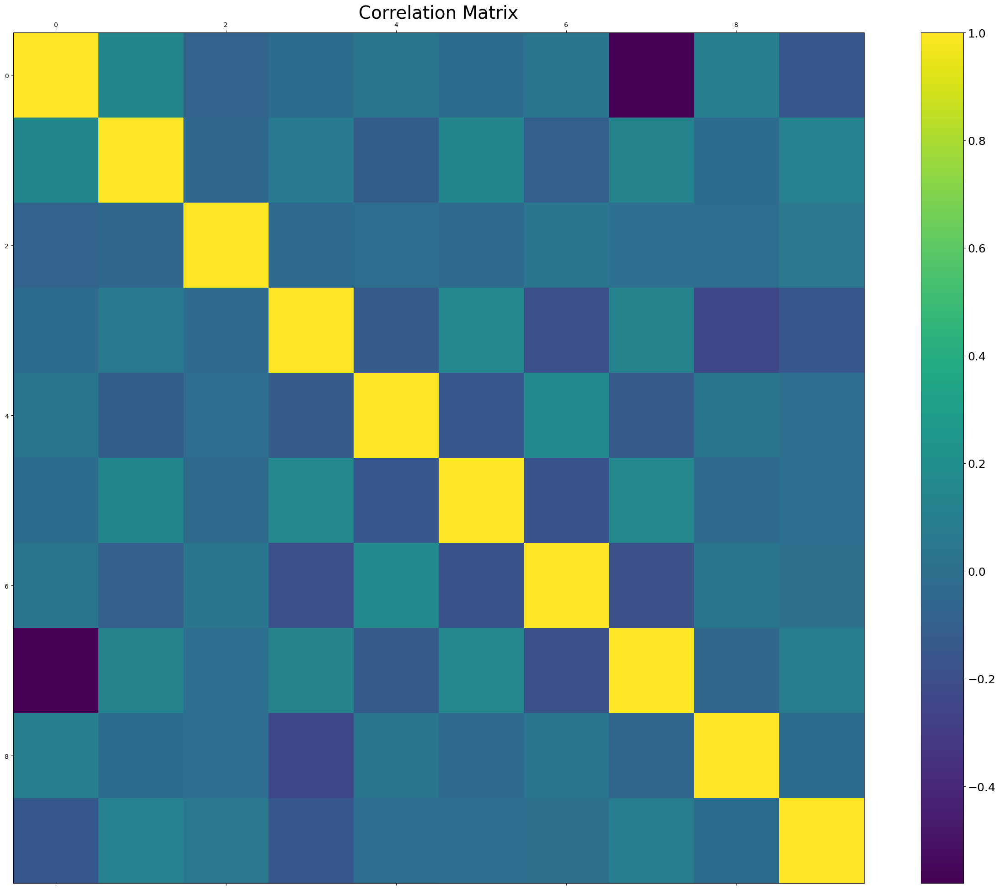

In [35]:
corr_matrix = df_train.corr()
import matplotlib.pyplot as plt

f = plt.figure(figsize=(32, 24))
plt.matshow(corr_matrix, fignum=f.number)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=18)
plt.title('Correlation Matrix', fontsize=28)

__Сохранение данных__

In [201]:
# df_train.to_csv('train_data_processed.csv')
# df_test.to_csv('test_data_processed.csv')

# Data generation and augmentation

In [ ]:
# # загрузка исходного датасета
# data = df

# # генерация новых данных
# new_data = pd.DataFrame(columns=data.columns)

# for _ in range(5000):
#     # выбираем случайные индексы из исходного датасета
#     indices = np.random.choice(data.index, size=10)

#     # создаем новую строку, как среднее выбранных строк
#     new_row = data.loc[indices].mean()

#     # добавляем новую строку в новый датасет
#     new_data = new_data.append(new_row, ignore_index=True)

# df = pd.concat([df,new_data], axis=0, join='inner')

# Создание и обучение моделей ML

In [204]:
# Загрузка данных

df_train = pd.read_csv('train_data_processed.csv')
df_test = pd.read_csv('test_data_processed.csv')

In [36]:
# Выделение выборки валидации из тренировочной части

df_train, df_valid = train_test_split(df_train, test_size=0.2, random_state=42)

In [198]:
# Сохраним валидационный сет

# df_valid.to_csv('valid_data_processed.csv')

In [37]:
feature_columns = [
    'Client_age', 'Gender_Male', 'Numb_of_Prod', 'Salary',
    'HasCrCard', 'Numb_of_years', 'CreditScore', 'Balance', 'IsActiveMember',
]
target_col = 'res'

In [39]:
params_xgb = {
    'n_estimators': np.arange(1, 100, 25),
    'max_depth': np.arange(1, 10, 3),
    'max_leaves': np.arange(0, 20, 3),
    # 'grow_policy': [0, 1],
    'learning_rate': np.arange(0.1, 1, 0.3),
    # 'booster': ['gbtree', 'gblinear', 'dart'],
    # 'subsample': np.arange(0.6, 0.8, 0.1),
    # 'colsample_bytree': np.arange(0.6, 0.8, 0.1),
    # 'colsample_bylevel': np.arange(0.6, 0.8, 0.1),
    # 'colsample_bynode': np.arange(0.6, 0.8, 0.1),
    'reg_alpha': np.arange(0, 1, 0.5),
    'reg_lambda': np.arange(0, 1, 0.5),
}

params_lgb = {
    'n_estimators': np.arange(1, 100, 25),
    'max_depth': np.arange(1, 10, 3),
    'num_leaves': np.arange(0, 20, 3),
    'learning_rate': np.arange(0.1, 1, 0.3),
    # 'boosting_type': ['gbdt', 'goss', 'dart'],
    # 'subsample': np.arange(0.6, 0.8, 0.1),
    # 'colsample_bytree': np.arange(0.6, 0.8, 0.1),
    'reg_alpha': np.arange(0, 1, 0.5),
    'reg_lambda': np.arange(0, 1, 0.5),
}

params_rf = {
    'n_estimators': np.arange(1, 100, 50),
    'max_leaves': np.arange(0, 20, 10),
    'learning_rate': np.arange(0.1, 1, 0.3),
    'reg_alpha': np.arange(0, 1, 0.5),
    'reg_lambda': np.arange(0, 1, 0.5),
}

params_log = {
    'l1_ratio': np.arange(0, 1, 0.2),
    'C': np.arange(0.001, 0.01, 0.001),
}

In [40]:
# Создание моделей
model_xgb = GridSearchCV(
    XGBClassifier(
        n_jobs=-1,
        random_state=42,
        eval_metric=roc_auc_score,
        early_stopping_rounds=5,
        colsample_bytree=0.8,
        colsample_bylevel=0.8,
        colsample_bynode=0.8,
        subsample=0.8,
    ),
    param_grid=params_xgb,
    scoring='roc_auc',
    cv=4,
    verbose=2,
)

model_lgb = GridSearchCV(
    LGBMClassifier(
        n_jobs=-1,
        random_state=42,
        subsample=0.8,
        colsample_bytree=0.8,
    ),
    param_grid=params_lgb,
    scoring='roc_auc',
    cv=4,
    verbose=2,
)

model_rf = GridSearchCV(
    XGBRFClassifier(
        n_jobs=-1,
        random_state=42,
        eval_metric=roc_auc_score,
        colsample_bytree=0.8,
        colsample_bylevel=0.8,
        colsample_bynode=0.8,
        subsample=0.8,
        max_depth=8
    ),
    param_grid=params_rf,
    scoring='roc_auc',
    cv=4,
    verbose=2,
)

model_log = GridSearchCV(
    LogisticRegression(
        penalty='elasticnet',
        max_iter=300,
        solver='saga',
    ),
    param_grid=params_log,
    scoring='roc_auc',
    cv=4,
    verbose=2,
)

In [41]:
# Обучение XGB бустинга
model_xgb.fit(
    X=df_train[feature_columns],
    y=df_train[target_col],
    eval_set=[(df_valid[feature_columns], df_valid[target_col])],
)

Fitting 4 folds for each of 1008 candidates, totalling 4032 fits
[0]	validation_0-logloss:0.63251	validation_0-roc_auc_score:0.71035
[CV] END learning_rate=0.1, max_depth=1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.8s
[0]	validation_0-logloss:0.63274	validation_0-roc_auc_score:0.71035
[CV] END learning_rate=0.1, max_depth=1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[0]	validation_0-logloss:0.63286	validation_0-roc_auc_score:0.71035
[CV] END learning_rate=0.1, max_depth=1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[0]	validation_0-logloss:0.63280	validation_0-roc_auc_score:0.71035
[CV] END learning_rate=0.1, max_depth=1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[0]	validation_0-logloss:0.63255	validation_0-roc_auc_score:0.71035
[CV] END learning_rate=0.1, max_depth=1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.5; total tim

GridSearchCV(cv=4,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=0.8,
                                     colsample_bynode=0.8, colsample_bytree=0.8,
                                     early_stopping_rounds=5,
                                     enable_categorical=False,
                                     eval_metric=<function roc_auc_score at 0x0000019AF667BEE0>,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_con...
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=-1,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=42, ...),
             param_grid={'learning_rate': array([0.1, 0.4, 0.7]),
                         'max_depth': array([1, 4, 7]),
                         'max_leaves': array([ 0,  3,  6,  9, 12, 15, 18]),
                         'n_estimators': array([ 1, 26, 51, 76]),
                         'reg_alpha': array([0. , 0.5]),
                         'reg_lambda': array([0. , 0.5])},
             scoring='roc_auc', verbose=2)

In [43]:
# Обучение LGBM бустинга
model_lgb.fit(
    X=df_train[feature_columns],
    y=df_train[target_col],
    eval_set=[(df_valid[feature_columns], df_valid[target_col])],
)

Fitting 4 folds for each of 1008 candidates, totalling 4032 fits
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.5; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.5; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, reg_lambda=0.5; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=1, n_estimators=1, num_leaves=0, reg_alpha=0.0, re

GridSearchCV(cv=4,
             estimator=LGBMClassifier(colsample_bytree=0.8, random_state=42,
                                      subsample=0.8),
             param_grid={'learning_rate': array([0.1, 0.4, 0.7]),
                         'max_depth': array([1, 4, 7]),
                         'n_estimators': array([ 1, 26, 51, 76]),
                         'num_leaves': array([ 0,  3,  6,  9, 12, 15, 18]),
                         'reg_alpha': array([0. , 0.5]),
                         'reg_lambda': array([0. , 0.5])},
             scoring='roc_auc', verbose=2)

In [44]:
# Обучение XGB случайного леса
model_rf.fit(
    X=df_train[feature_columns],
    y=df_train[target_col],
    eval_set=[(df_valid[feature_columns], df_valid[target_col])],
)

Fitting 4 folds for each of 48 candidates, totalling 192 fits
[0]	validation_0-logloss:0.62349	validation_0-roc_auc_score:0.92931
[CV] END learning_rate=0.1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.2s
[0]	validation_0-logloss:0.62362	validation_0-roc_auc_score:0.93262
[CV] END learning_rate=0.1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[0]	validation_0-logloss:0.62388	validation_0-roc_auc_score:0.92837
[CV] END learning_rate=0.1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[0]	validation_0-logloss:0.62335	validation_0-roc_auc_score:0.93460
[CV] END learning_rate=0.1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.0; total time=   0.0s
[0]	validation_0-logloss:0.62373	validation_0-roc_auc_score:0.93363
[CV] END learning_rate=0.1, max_leaves=0, n_estimators=1, reg_alpha=0.0, reg_lambda=0.5; total time=   0.0s
[0]	validation_0-logloss:0.62380	validation_0-roc_auc_scor

GridSearchCV(cv=4,
             estimator=XGBRFClassifier(base_score=None, booster=None,
                                       callbacks=None, colsample_bylevel=0.8,
                                       colsample_bytree=0.8,
                                       early_stopping_rounds=None,
                                       enable_categorical=False,
                                       eval_metric=<function roc_auc_score at 0x0000019AF667BEE0>,
                                       feature_types=None, gamma=None,
                                       gpu_id=None, grow_policy=None,
                                       importance_type=None,
                                       interaction_constraints=None,
                                       ma...
                                       missing=nan, monotone_constraints=None,
                                       n_estimators=100, n_jobs=-1,
                                       num_parallel_tree=None,
                                       objective='binary:logistic',
                                       predictor=None, random_state=42,
                                       reg_alpha=None, ...),
             param_grid={'learning_rate': array([0.1, 0.4, 0.7]),
                         'max_leaves': array([ 0, 10]),
                         'n_estimators': array([ 1, 51]),
                         'reg_alpha': array([0. , 0.5]),
                         'reg_lambda': array([0. , 0.5])},
             scoring='roc_auc', verbose=2)

In [46]:
# Обучение логистической регрессии
model_log.fit(
    X=df_train[feature_columns],
    y=df_train[target_col],
)

Fitting 4 folds for each of 45 candidates, totalling 180 fits
[CV] END ..............................C=0.001, l1_ratio=0.0; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.0; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.0; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.0; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.2; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.2; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.2; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.2; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.4; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.4; total time=   0.0s
[CV] END ..............................C=0.001, l1_ratio=0.4; total time=   0.0s
[CV] END ..............................C=0.001,

GridSearchCV(cv=4,
             estimator=LogisticRegression(max_iter=300, penalty='elasticnet',
                                          solver='saga'),
             param_grid={'C': array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009]),
                         'l1_ratio': array([0. , 0.2, 0.4, 0.6, 0.8])},
             scoring='roc_auc', verbose=2)

In [47]:
# Сохранение моделей

# with open('model_xgb.pkl','wb') as f:
#     pickle.dump(model_xgb.best_estimator_, f)
# with open('model_lgb.pkl','wb') as f:
#     pickle.dump(model_lgb.best_estimator_, f)
# with open('model_rf.pkl','wb') as f:
#     pickle.dump(model_rf.best_estimator_, f)
# with open('model_log.pkl','wb') as f:
#     pickle.dump(model_log.best_estimator_, f)

# Создание и обучение нейронной сети

In [111]:
# Строим модель

model_1 = Sequential([
    Dense(7, input_shape=(9,), activation='relu'),
    Dense(7, activation='sigmoid'),
    Dense(2, activation='softmax'),
])

model_2 = Sequential([
    Dense(10, input_shape=(9,), activation='relu'),
    Dense(10, activation='sigmoid'),
    Dense(2, activation='softmax'),
])

model_3 = Sequential([
    Dense(13, input_shape=(9,), activation='relu'),
    Dense(13, activation='sigmoid'),
    Dense(2, activation='softmax'),
])

model_4 = Sequential([
    Dense(7, input_shape=(9,), activation='relu'),
    Dense(7, activation='relu'),
    Dense(7, activation='sigmoid'),
    Dense(2, activation='softmax'),
])

model_5 = Sequential([
    Dense(7, input_shape=(9,), activation='relu'),
    Dense(7, activation='relu'),
    Dense(7, activation='relu'),
    Dense(7, activation='sigmoid'),
    Dense(2, activation='softmax'),
])

model_6 = Sequential([
    Dense(7, input_shape=(9,), activation='relu'),
    Dense(7, activation='relu'),
    Dense(2, activation='softmax'),
])

model_7 = Sequential([
    Dense(7, input_shape=(9,), activation='relu'),
    Dense(7, activation='relu'),
    Dense(7, activation='relu'),
    Dense(2, activation='softmax'),
])

models = [model_1, model_2, model_3, model_4, model_5, model_6, model_7]

In [112]:
logs = []
for model in models:

    # Задание параметров обучения модели
    model.compile(
        loss='categorical_crossentropy', # Функция потерь
        optimizer=Adam(0.1), # Алгоритм поиска минимума и его шаг
        metrics=['accuracy', metrics.AUC()] # Метрики, которые будем отслеживать
    )

    # Обучение модели
    log = model.fit(
        pd.concat([df_train[feature_columns], df_valid[feature_columns]]),
        to_categorical(
            pd.concat([df_train[target_col], df_valid[target_col]]), 2,
        ),
        batch_size=64,
        epochs=15,
        validation_split=0.2,
    )

    logs.append(log)

Epoch 1/15
202/202 [==============================] - 2s 5ms/step - loss: 0.2993 - accuracy: 0.8816 - auc_36: 0.9440 - val_loss: 0.2694 - val_accuracy: 0.8938 - val_auc_36: 0.9560
Epoch 2/15
202/202 [==============================] - 1s 3ms/step - loss: 0.2573 - accuracy: 0.8932 - auc_36: 0.9588 - val_loss: 0.2589 - val_accuracy: 0.8932 - val_auc_36: 0.9592
Epoch 3/15
202/202 [==============================] - 1s 3ms/step - loss: 0.2533 - accuracy: 0.8908 - auc_36: 0.9603 - val_loss: 0.2489 - val_accuracy: 0.8926 - val_auc_36: 0.9627
Epoch 4/15
202/202 [==============================] - 1s 5ms/step - loss: 0.2549 - accuracy: 0.8909 - auc_36: 0.9601 - val_loss: 0.2534 - val_accuracy: 0.8907 - val_auc_36: 0.9606
Epoch 5/15
202/202 [==============================] - 1s 4ms/step - loss: 0.2499 - accuracy: 0.8926 - auc_36: 0.9615 - val_loss: 0.2460 - val_accuracy: 0.8935 - val_auc_36: 0.9630
Epoch 6/15
202/202 [==============================] - 1s 4ms/step - loss: 0.2503 - accuracy: 0.8903 

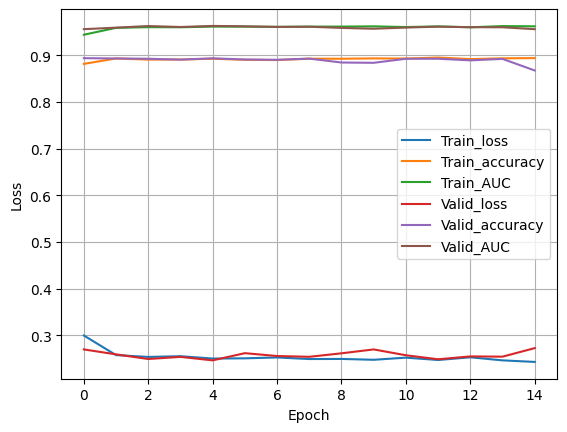

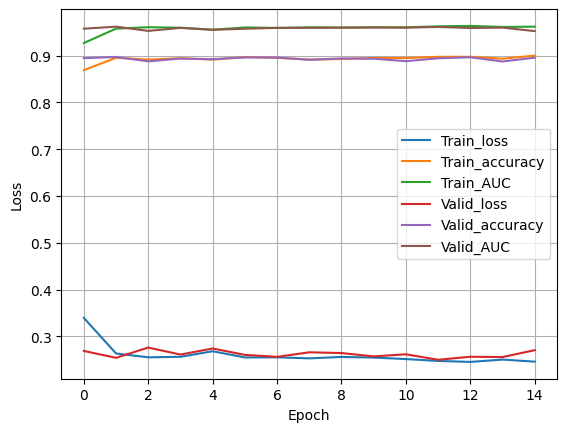

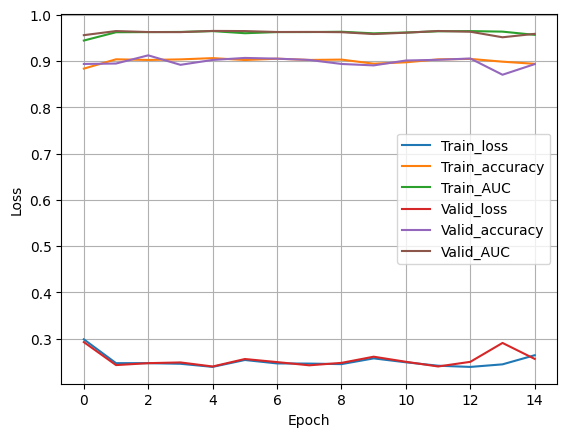

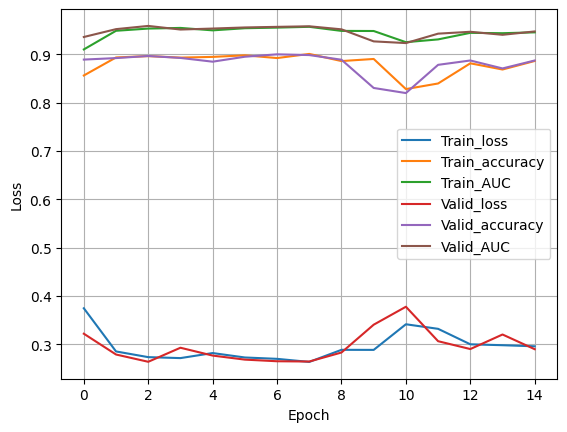

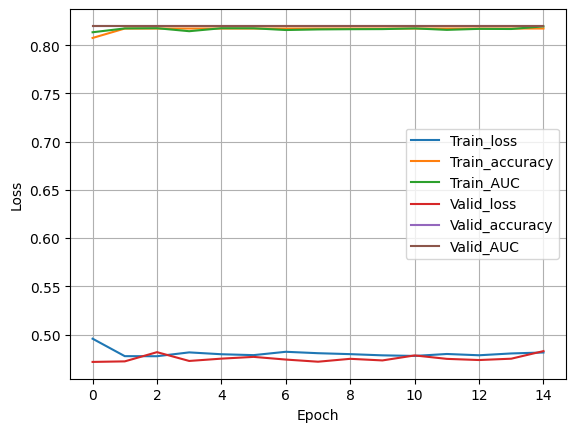

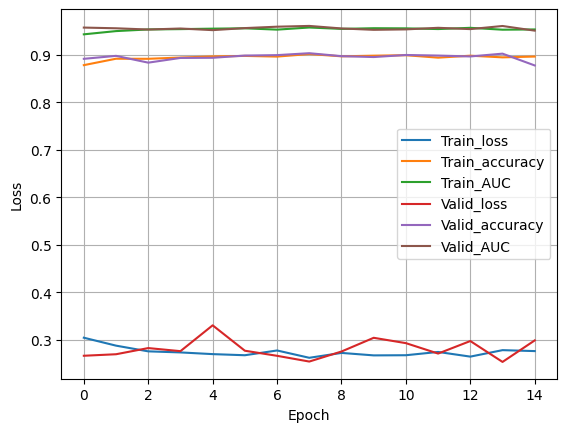

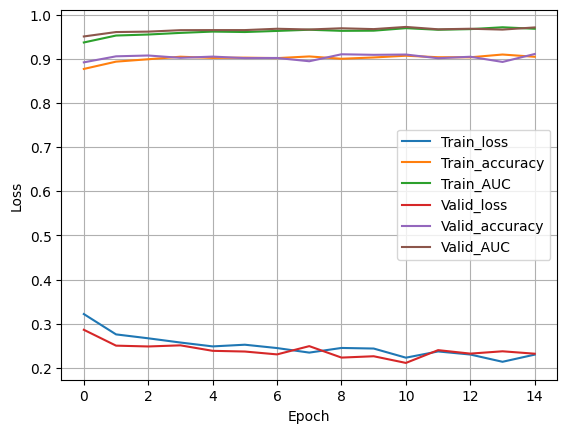

In [115]:
# Первое представление графиков (один график на модель)

figs = []
for i, log in enumerate(logs):
    fig = plt.figure()
    plt.plot(log.history['loss'], label='Train_loss')
    plt.plot(log.history['accuracy'], label='Train_accuracy')
    plt.plot(log.history[f'auc_{i + 36}'], label='Train_AUC')
    plt.plot(log.history['val_loss'], label='Valid_loss')
    plt.plot(log.history['val_accuracy'], label='Valid_accuracy')
    plt.plot(log.history[f'val_auc_{i + 36}'], label='Valid_AUC')
    plt.grid(True)
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    figs.append(fig)

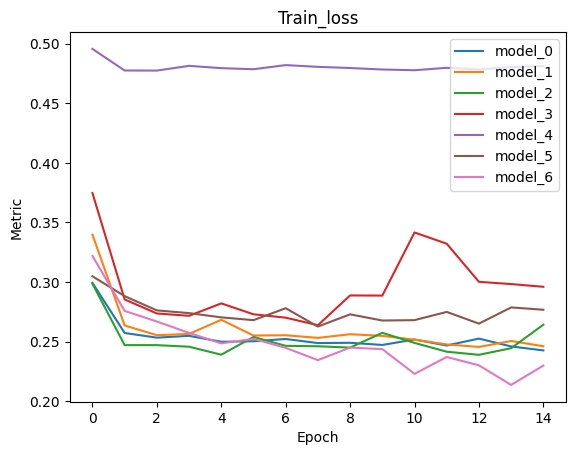

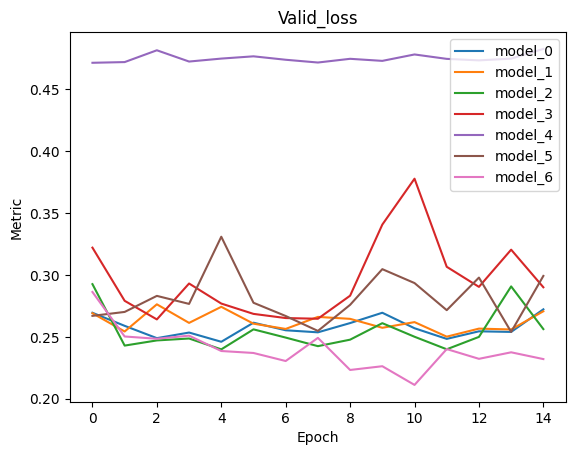

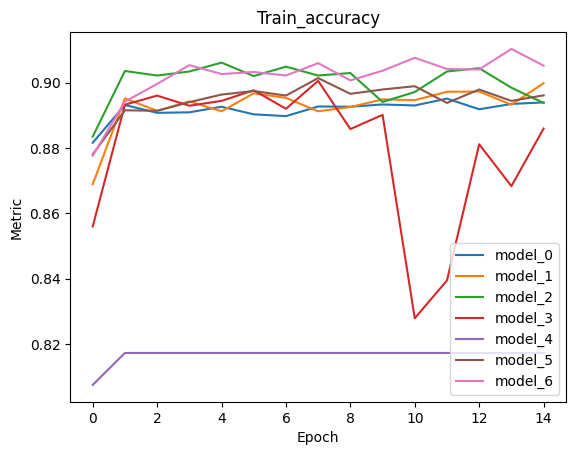

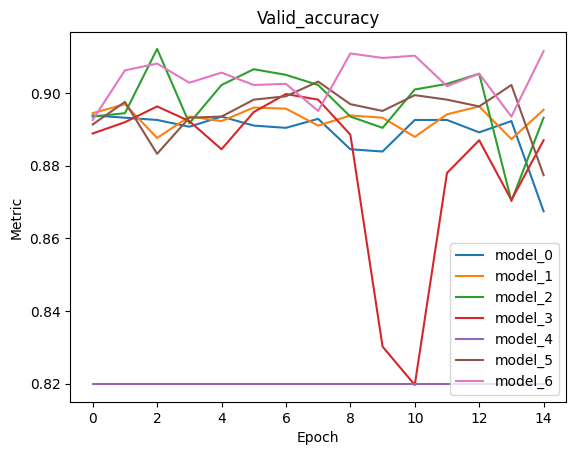

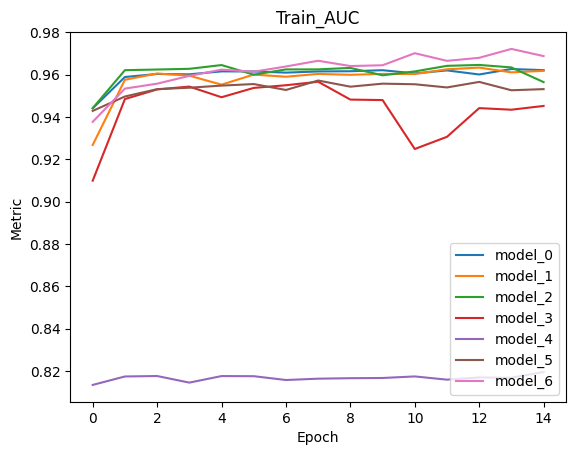

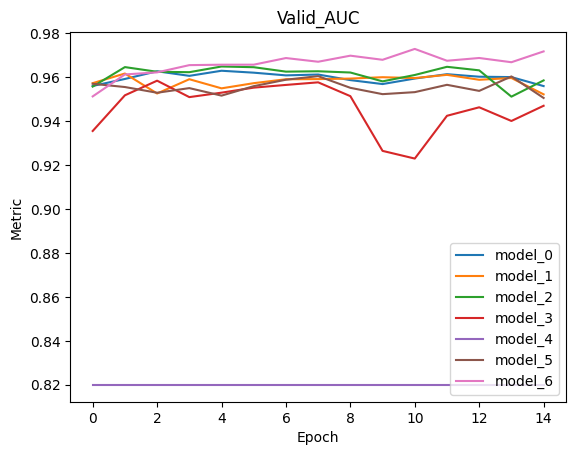

In [129]:
# Второе представление графиков (один график на метрику)

figs2 = []

fig = plt.figure()
for j, log in enumerate(logs):
    plt.title('Train_loss')
    plt.plot(log.history['loss'], label=f'model_{j}')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.legend(loc='upper right')
figs2.append(fig)

fig = plt.figure()
for j, log in enumerate(logs):
    plt.title('Valid_loss')
    plt.plot(log.history['val_loss'], label=f'model_{j}')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.legend(loc='upper right')
figs2.append(fig)

fig = plt.figure()
for j, log in enumerate(logs):
    plt.title('Train_accuracy')
    plt.plot(log.history['accuracy'], label=f'model_{j}')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.legend(loc='lower right')
figs2.append(fig)

fig = plt.figure()
for j, log in enumerate(logs):
    plt.title('Valid_accuracy')
    plt.plot(log.history['val_accuracy'], label=f'model_{j}')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.legend(loc='lower right')
figs2.append(fig)

fig = plt.figure()
for j, log in enumerate(logs):
    plt.title('Train_AUC')
    plt.plot(log.history[f'auc_{j+36}'], label=f'model_{j}')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.legend(loc='lower right')
figs2.append(fig)

fig = plt.figure()
for j, log in enumerate(logs):
    plt.title('Valid_AUC')
    plt.plot(log.history[f'val_auc_{j+36}'], label=f'model_{j}')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    plt.legend(loc='lower right')
figs2.append(fig)

In [132]:
# Сохранение графиков

# for i, fig in enumerate(figs2):
#     fig.savefig(f'fig_{i}.pdf')

In [336]:
# Подгрузим нейронки

models = []
for i in range(7):
    models.append(load_model(f'model_nn_{i}.h5'))

In [337]:
# Сохраняем метрики нейронок в датафрейме

df_metrics = pd.DataFrame(columns=[
    'Train_loss', 'Valid_loss', 'Test_loss',
    'Train_accuracy', 'Valid_accuracy', 'Test_accuracy',
    'Train_AUC', 'Valid_AUC', 'Test_AUC',
])
for i, model in enumerate(models):
    row = model.evaluate(
        df_train[feature_columns],
        to_categorical(df_train[target_col], 2))
    row += model.evaluate(
        df_valid[feature_columns],
        to_categorical(df_valid[target_col], 2))
    row += model.evaluate(
        df_test[feature_columns],
        to_categorical(df_test[target_col], 2))
    row = [round(j, 3) for j in row]

    df_metrics.loc[f'model_{i}'] = row
    

126/126 [==============================] - 1s 5ms/step - loss: 0.2310 - accuracy: 0.9101 - auc_42: 0.9706


In [153]:
# df_metrics.to_csv('metrics_nn.csv')

In [147]:
# Сохранение моделей

# for i, model in enumerate(models):
#     model.save(f'model_nn_{i}.h5')

# Получение метрик моделей ML

In [180]:
# Подгружаем модели

with open('model_xgb.pkl', 'rb') as f:
    model_xgb = pickle.load(f)
with open('model_lgb.pkl', 'rb') as f:
    model_lgb = pickle.load(f)
with open('model_rf.pkl', 'rb') as f:
    model_rf = pickle.load(f)
with open('model_log.pkl', 'rb') as f:
    model_log = pickle.load(f)

In [191]:
# Подгружаем датасет с метриками

df_metrics = pd.read_csv('metrics_nn.csv')
df_metrics.set_index('Unnamed: 0')

,Train_loss,Valid_loss,Test_loss,Train_accuracy,Valid_accuracy,Test_accuracy,Train_AUC,Valid_AUC,Test_AUC
Unnamed: 0,,,,,,,,,
model_0,0.255,0.878,0.962,0.272,0.867,0.956,0.255,0.873,0.961
model_1,0.262,0.900,0.955,0.271,0.895,0.952,0.260,0.906,0.956
model_2,0.252,0.897,0.961,0.256,0.893,0.959,0.243,0.901,0.963
model_3,0.276,0.893,0.953,0.290,0.887,0.947,0.271,0.895,0.954
model_4,0.486,0.817,0.817,0.483,0.820,0.820,0.484,0.819,0.819
model_5,0.297,0.879,0.951,0.299,0.877,0.951,0.295,0.881,0.951
model_6,0.226,0.912,0.972,0.232,0.912,0.972,0.231,0.910,0.971


In [338]:
models_ml = [model_xgb, model_lgb, model_rf, model_log]
names = ['model_xgb', 'model_lgb', 'model_rf', 'model_log']

In [340]:
# Сохраняем метрики нейронок в датафрейме

for i, model in enumerate(models_ml):

    preds_train = model.predict_proba(df_train[feature_columns])[:,1]
    preds_valid = model.predict_proba(df_valid[feature_columns])[:,1]
    preds_test = model.predict_proba(df_test[feature_columns])[:,1]

    labels_train = model.predict(df_train[feature_columns])
    labels_valid = model.predict(df_valid[feature_columns])
    labels_test = model.predict(df_test[feature_columns])

    row = [
        #names[i],
        log_loss(df_train[target_col], preds_train),
        log_loss(df_valid[target_col], preds_valid),
        log_loss(df_test[target_col], preds_test),
        accuracy_score(df_train[target_col], labels_train),
        accuracy_score(df_valid[target_col], labels_valid),
        accuracy_score(df_test[target_col], labels_test),
        roc_auc_score(df_train[target_col], preds_train),
        roc_auc_score(df_valid[target_col], preds_valid),
        roc_auc_score(df_test[target_col], preds_test),
    ]
    row = [round(j, 3) if j is not None and type(j) != str else j for j in row]

    df_metrics.loc[names[i]] = row

In [165]:
# df_metrics.to_csv('metrics_all.csv')

# Калибровка

In [196]:
# Подгружаем модели

with open('model_xgb.pkl', 'rb') as f:
    model_xgb = pickle.load(f)
with open('model_lgb.pkl', 'rb') as f:
    model_lgb = pickle.load(f)
with open('model_rf.pkl', 'rb') as f:
    model_rf = pickle.load(f)
with open('model_log.pkl', 'rb') as f:
    model_log = pickle.load(f)

models_nn = []
for i in range(7):
    models_nn.append(load_model(f'model_nn_{i}.h5'))

models_all = [model_xgb, model_lgb, model_rf, model_log] + models_nn

In [343]:
# Назначим имена моделям
names = ['model_xgb', 'model_lgb', 'model_rf', 'model_log',
         'model_nn_0', 'model_nn_1', 'model_nn_2', 'model_nn_3', 'model_nn_4',
         'model_nn_5', 'model_nn_6',
        ]

In [216]:
# Будем использовать valid датасет в качестве калибровочного
df_valid = pd.read_csv('valid_data_processed.csv')

In [217]:
# Получаем колонки со скорами каждой модели на валидационном датасете

for i, model in enumerate(models_all):
    if not isinstance(model, Sequential):
        df_valid[f'{names[i]}_score'] = model.predict_proba(df_valid[feature_columns])[:,1]
    else:
        df_valid[f'{names[i]}_score'] = model.predict(df_valid[feature_columns])[:,1]

101/101 [==============================] - 0s 2ms/step


In [218]:
df_valid.columns

Index(['Unnamed: 0', 'res', 'Client_age', 'Gender_Male', 'Numb_of_Prod',
       'Salary', 'HasCrCard', 'Numb_of_years', 'CreditScore', 'Balance',
       'IsActiveMember', 'model_xgb_score', 'model_lgb_score',
       'model_rf_score', 'model_log_score', 'model_nn_0_score',
       'model_nn_1_score', 'model_nn_2_score', 'model_nn_3_score',
       'model_nn_4_score', 'model_nn_5_score', 'model_nn_6_score'],
      dtype='object')

In [220]:
# Обучаем калибраторы

calibrators = []
for i, model in enumerate(models_all):
    calibrator = LogisticRegression()
    calibrator.fit(pd.DataFrame(df_valid[f'{names[i]}_score']), df_valid[target_col])
    calibrators.append(calibrator)

__Тестирование откалиброванных моделей__

In [222]:
# Сначала создаем колонки со скорами всех моделей на train и test

for i, model in enumerate(models_all):
    if not isinstance(model, Sequential):
        df_train[f'{names[i]}_score'] = model.predict_proba(df_train[feature_columns])[:,1]
    else:
        df_train[f'{names[i]}_score'] = model.predict(df_train[feature_columns])[:,1]

for i, model in enumerate(models_all):
    if not isinstance(model, Sequential):
        df_test[f'{names[i]}_score'] = model.predict_proba(df_test[feature_columns])[:,1]
    else:
        df_test[f'{names[i]}_score'] = model.predict(df_test[feature_columns])[:,1]

126/126 [==============================] - 0s 3ms/step


In [230]:
# Теперь подгружаем датасет с метриками

df_metrics = pd.read_csv('metrics_all.csv')

In [225]:
df_metrics.head()

,Unnamed: 0,Train_loss,Valid_loss,Test_loss,Train_accuracy,Valid_accuracy,Test_accuracy,Train_AUC,Valid_AUC,Test_AUC
0,model_0,0.255,0.878,0.962,0.272,0.867,0.956,0.255,0.873,0.961
1,model_1,0.262,0.900,0.955,0.271,0.895,0.952,0.260,0.906,0.956
2,model_2,0.252,0.897,0.961,0.256,0.893,0.959,0.243,0.901,0.963
3,model_3,0.276,0.893,0.953,0.290,0.887,0.947,0.271,0.895,0.954
4,model_4,0.486,0.817,0.817,0.483,0.820,0.820,0.484,0.819,0.819


In [344]:
# Подсчитываем метрики калибраторов и добавляем в датафрейм

for i, calibrator in enumerate(calibrators):

    preds_train = calibrator.predict_proba(pd.DataFrame(df_train[f'{names[i]}_score']))[:,1]
    preds_valid = calibrator.predict_proba(pd.DataFrame(df_valid[f'{names[i]}_score']))[:,1]
    preds_test = calibrator.predict_proba(pd.DataFrame(df_test[f'{names[i]}_score']))[:,1]

    labels_train = calibrator.predict(pd.DataFrame(df_train[f'{names[i]}_score']))
    labels_valid = calibrator.predict(pd.DataFrame(df_valid[f'{names[i]}_score']))
    labels_test = calibrator.predict(pd.DataFrame(df_test[f'{names[i]}_score']))

    row = [
        #f'{names[i]}_calibrated',
        log_loss(df_train[target_col], preds_train),
        log_loss(df_valid[target_col], preds_valid),
        log_loss(df_test[target_col], preds_test),
        accuracy_score(df_train[target_col], labels_train),
        accuracy_score(df_valid[target_col], labels_valid),
        accuracy_score(df_test[target_col], labels_test),
        roc_auc_score(df_train[target_col], preds_train),
        roc_auc_score(df_valid[target_col], preds_valid),
        roc_auc_score(df_test[target_col], preds_test),
    ]
    row = [round(j, 3) if j is not None and type(j) != str else j for j in row]

    df_metrics.loc[f'{names[i]}_calibrated'] = row

In [229]:
df_metrics.set_index(df_metrics.columns[0])

,Train_loss,Valid_loss,Test_loss,Train_accuracy,Valid_accuracy,Test_accuracy,Train_AUC,Valid_AUC,Test_AUC
Unnamed: 0,,,,,,,,,
model_0,0.255,0.878,0.962,0.272,0.867,0.956,0.255,0.873,0.961
model_1,0.262,0.900,0.955,0.271,0.895,0.952,0.260,0.906,0.956
model_2,0.252,0.897,0.961,0.256,0.893,0.959,0.243,0.901,0.963
model_3,0.276,0.893,0.953,0.290,0.887,0.947,0.271,0.895,0.954
model_4,0.486,0.817,0.817,0.483,0.820,0.820,0.484,0.819,0.819
model_5,0.297,0.879,0.951,0.299,0.877,0.951,0.295,0.881,0.951
model_6,0.226,0.912,0.972,0.232,0.912,0.972,0.231,0.910,0.971
model_xgb,3.229,3.256,3.151,0.910,0.910,0.913,0.758,0.750,0.761
model_lgb,2.446,2.395,2.552,0.932,0.934,0.929,0.842,0.846,0.828


In [232]:
df_metrics.to_csv('metrics_all_calib.csv')

__Строим кривые надежности для неоткалиброванных моделей__

In [247]:
models_ml = [model_xgb, model_lgb, model_rf, model_log]
names_ml = ['model_xgb', 'model_lgb', 'model_rf', 'model_log']
names_nn = ['model_nn_0', 'model_nn_1', 'model_nn_2', 'model_nn_3', 'model_nn_4', 'model_nn_5', 'model_nn_6']

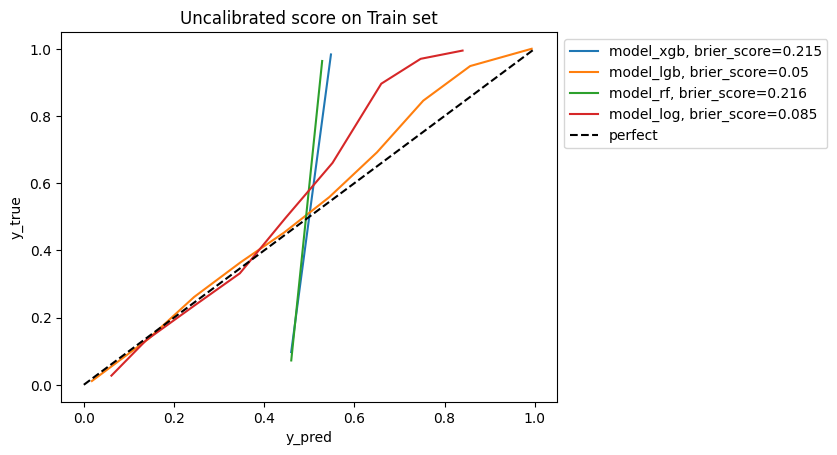

In [266]:
# Строим кривые надежности для классических неоткалиброванных моделей на тренировочном сете

fig = plt.figure()
for i, model in enumerate(models_ml):
    prob_true, prob_pred = calibration_curve(df_train[target_col], df_train[f'{names_ml[i]}_score'], n_bins=10)
    score = brier_score_loss(df_train[target_col], df_train[f'{names_ml[i]}_score'])
    plt.title('Uncalibrated score on Train set')
    plt.plot(prob_pred, prob_true, label=f'{names_ml[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_uncalib_train_ml.pdf')

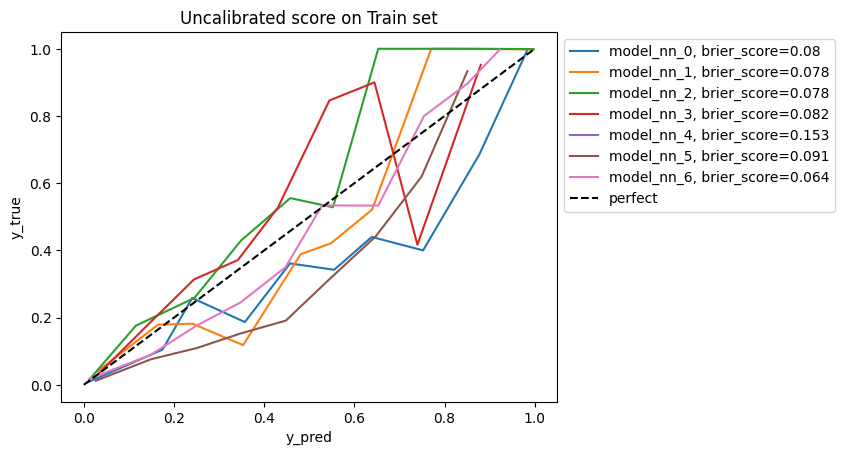

In [267]:
# Строим кривые надежности для неоткалиброванных нейронок на тренировочном сете

fig = plt.figure()
for i, model in enumerate(models_nn):
    prob_true, prob_pred = calibration_curve(df_train[target_col], df_train[f'{names_nn[i]}_score'], n_bins=10)
    score = brier_score_loss(df_train[target_col], df_train[f'{names_nn[i]}_score'])
    plt.title('Uncalibrated score on Train set')
    plt.plot(prob_pred, prob_true, label=f'{names_nn[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_uncalib_train_nn.pdf')

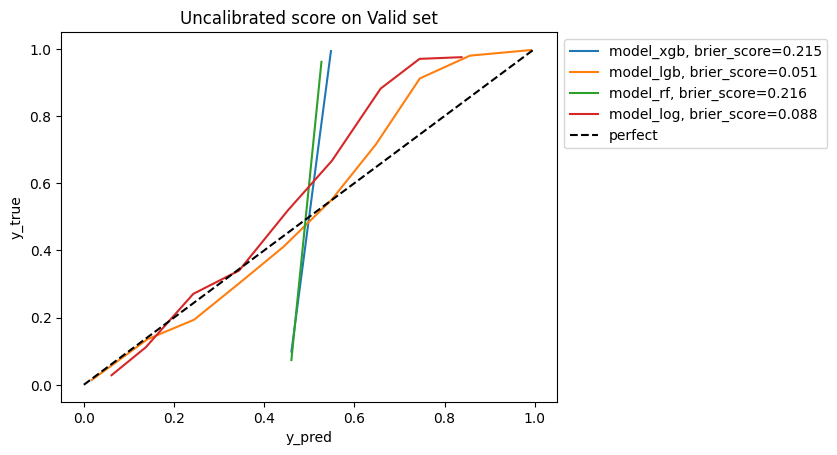

In [268]:
# Строим кривые надежности для классических неоткалиброванных моделей на валидационном сете

fig = plt.figure()
for i, model in enumerate(models_ml):
    prob_true, prob_pred = calibration_curve(df_valid[target_col], df_valid[f'{names_ml[i]}_score'], n_bins=10)
    score = brier_score_loss(df_valid[target_col], df_valid[f'{names_ml[i]}_score'])
    plt.title('Uncalibrated score on Valid set')
    plt.plot(prob_pred, prob_true, label=f'{names_ml[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_uncalib_valid_ml.pdf')

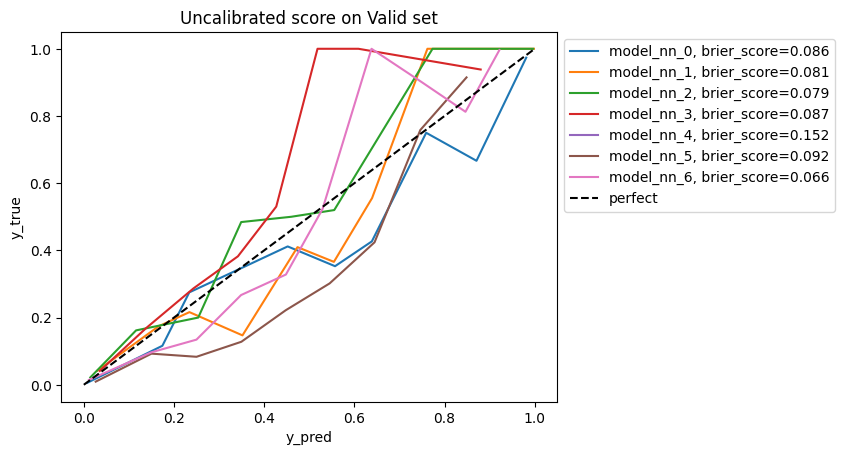

In [269]:
# Строим кривые надежности для неоткалиброванных нейронок на валидационном сете

fig = plt.figure()
for i, model in enumerate(models_nn):
    prob_true, prob_pred = calibration_curve(df_valid[target_col], df_valid[f'{names_nn[i]}_score'], n_bins=10)
    score = brier_score_loss(df_valid[target_col], df_valid[f'{names_nn[i]}_score'])
    plt.title('Uncalibrated score on Valid set')
    plt.plot(prob_pred, prob_true, label=f'{names_nn[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_uncalib_valid_nn.pdf')

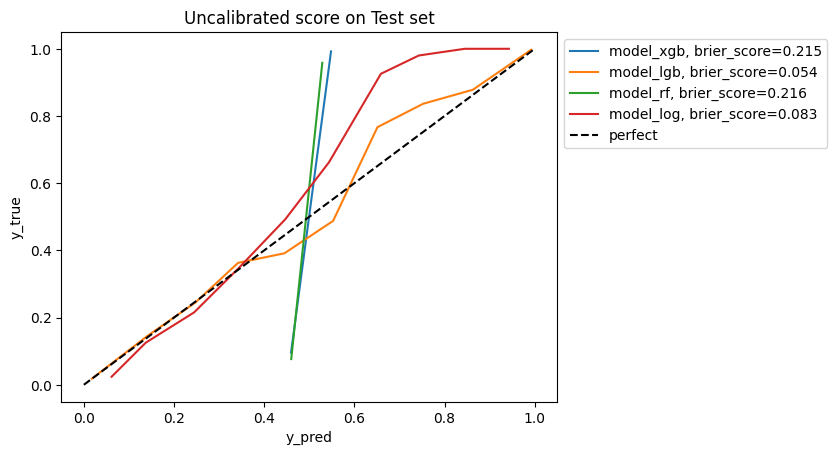

In [270]:
# Строим кривые надежности для классических неоткалиброванных моделей на тестовом сете

fig = plt.figure()
for i, model in enumerate(models_ml):
    prob_true, prob_pred = calibration_curve(df_test[target_col], df_test[f'{names_ml[i]}_score'], n_bins=10)
    score = brier_score_loss(df_test[target_col], df_test[f'{names_ml[i]}_score'])
    plt.title('Uncalibrated score on Test set')
    plt.plot(prob_pred, prob_true, label=f'{names_ml[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_uncalib_test_ml.pdf')

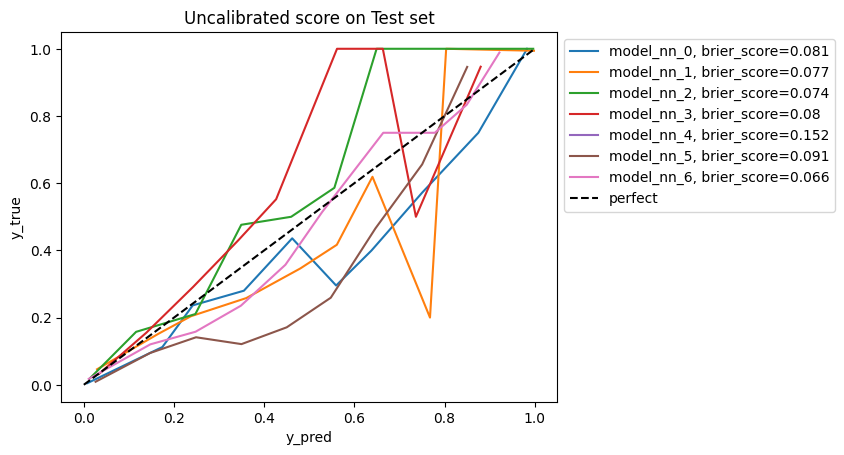

In [271]:
# Строим кривые надежности для неоткалиброванных нейронок на тестовом сете

fig = plt.figure()
for i, model in enumerate(models_nn):
    prob_true, prob_pred = calibration_curve(df_test[target_col], df_test[f'{names_nn[i]}_score'], n_bins=10)
    score = brier_score_loss(df_test[target_col], df_test[f'{names_nn[i]}_score'])
    plt.title('Uncalibrated score on Test set')
    plt.plot(prob_pred, prob_true, label=f'{names_nn[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_uncalib_test_nn.pdf')

__Строим кривые надежности для откалиброванных моделей__

In [264]:
calibrators_ml = calibrators[:4] # Первые 4 калибратора относятся к классическим моделям
calibrators_nn = calibrators[4:] # Остальные калибраторы относятся к нейронкам

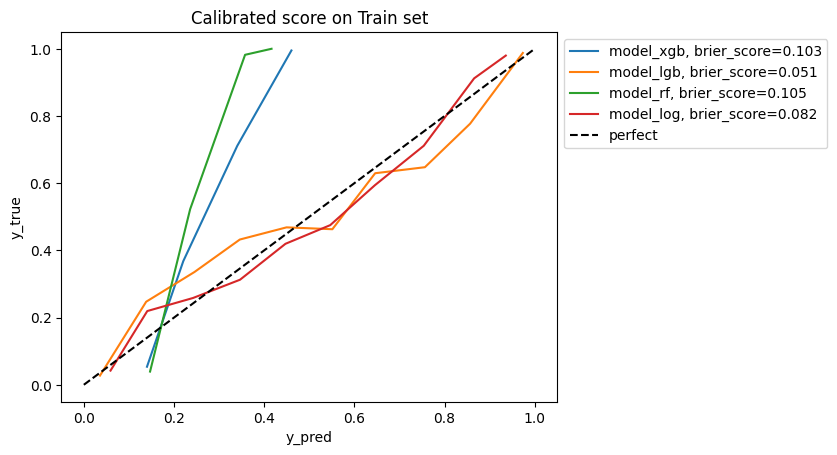

In [274]:
# Строим кривые надежности для классических откалиброванных моделей на тренировочном сете

fig = plt.figure()
for i, calibrator in enumerate(calibrators_ml):
    df_train[f'{names_ml[i]}_score_calib'] = calibrator.predict_proba(pd.DataFrame(df_train[f'{names_ml[i]}_score']))[:,1]
    prob_true, prob_pred = calibration_curve(df_train[target_col], df_train[f'{names_ml[i]}_score_calib'], n_bins=10)
    score = brier_score_loss(df_train[target_col], df_train[f'{names_ml[i]}_score_calib'])
    plt.title('Calibrated score on Train set')
    plt.plot(prob_pred, prob_true, label=f'{names_ml[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_calib_train_ml.pdf')

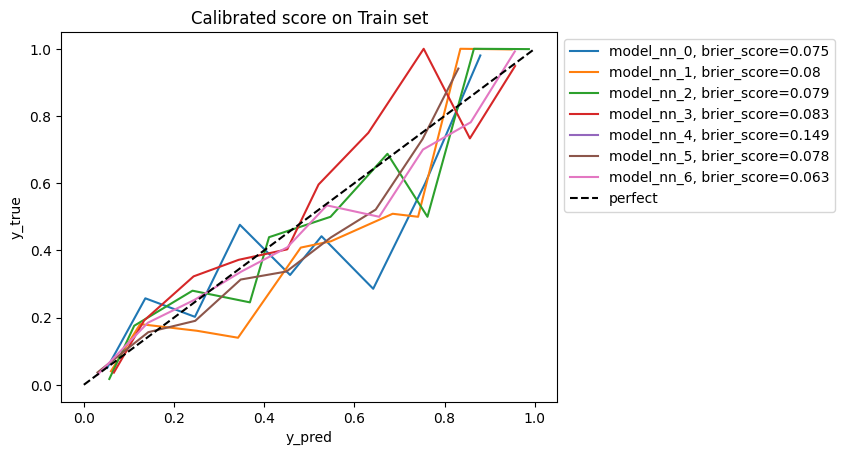

In [275]:
# Строим кривые надежности для откалиброванных нейронок на тренировочном сете

fig = plt.figure()
for i, calibrator in enumerate(calibrators_nn):
    df_train[f'{names_nn[i]}_score_calib'] = calibrator.predict_proba(pd.DataFrame(df_train[f'{names_nn[i]}_score']))[:,1]
    prob_true, prob_pred = calibration_curve(df_train[target_col], df_train[f'{names_nn[i]}_score_calib'], n_bins=10)
    score = brier_score_loss(df_train[target_col], df_train[f'{names_nn[i]}_score_calib'])
    plt.title('Calibrated score on Train set')
    plt.plot(prob_pred, prob_true, label=f'{names_nn[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_calib_train_nn.pdf')

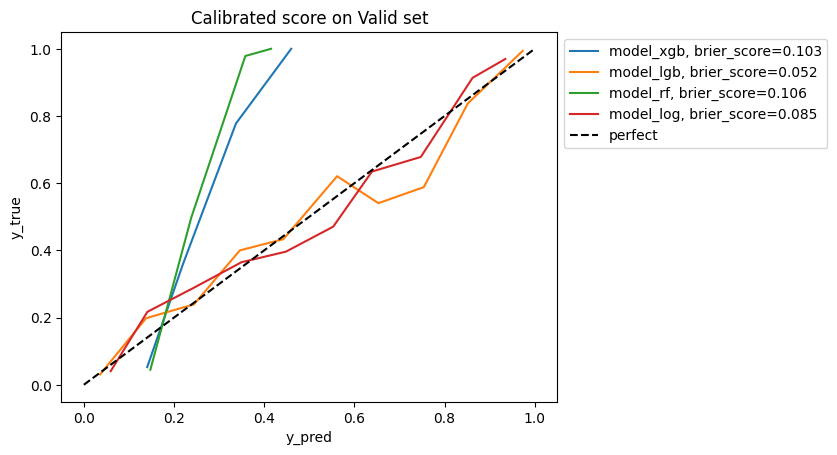

In [276]:
# Строим кривые надежности для классических откалиброванных моделей на валидационном сете

fig = plt.figure()
for i, calibrator in enumerate(calibrators_ml):
    df_valid[f'{names_ml[i]}_score_calib'] = calibrator.predict_proba(pd.DataFrame(df_valid[f'{names_ml[i]}_score']))[:,1]
    prob_true, prob_pred = calibration_curve(df_valid[target_col], df_valid[f'{names_ml[i]}_score_calib'], n_bins=10)
    score = brier_score_loss(df_valid[target_col], df_valid[f'{names_ml[i]}_score_calib'])
    plt.title('Calibrated score on Valid set')
    plt.plot(prob_pred, prob_true, label=f'{names_ml[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_calib_valid_ml.pdf')

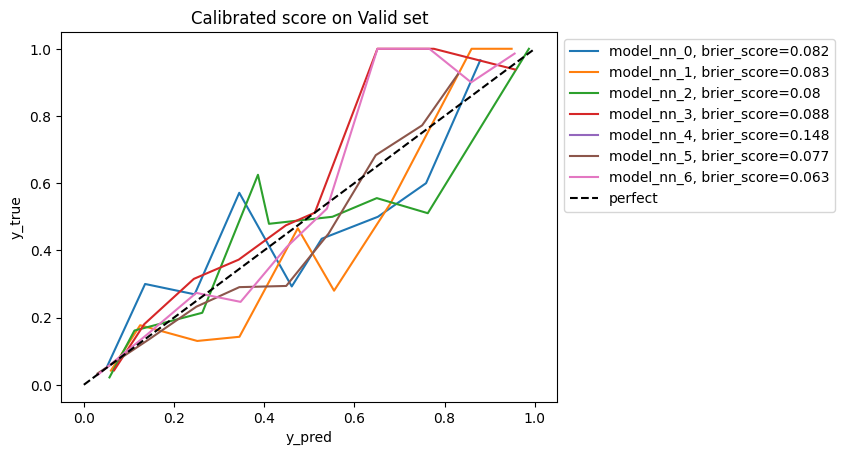

In [277]:
# Строим кривые надежности для откалиброванных нейронок на валидационном сете

fig = plt.figure()
for i, calibrator in enumerate(calibrators_nn):
    df_valid[f'{names_nn[i]}_score_calib'] = calibrator.predict_proba(pd.DataFrame(df_valid[f'{names_nn[i]}_score']))[:,1]
    prob_true, prob_pred = calibration_curve(df_valid[target_col], df_valid[f'{names_nn[i]}_score_calib'], n_bins=10)
    score = brier_score_loss(df_valid[target_col], df_valid[f'{names_nn[i]}_score_calib'])
    plt.title('Calibrated score on Valid set')
    plt.plot(prob_pred, prob_true, label=f'{names_nn[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_calib_valid_nn.pdf')

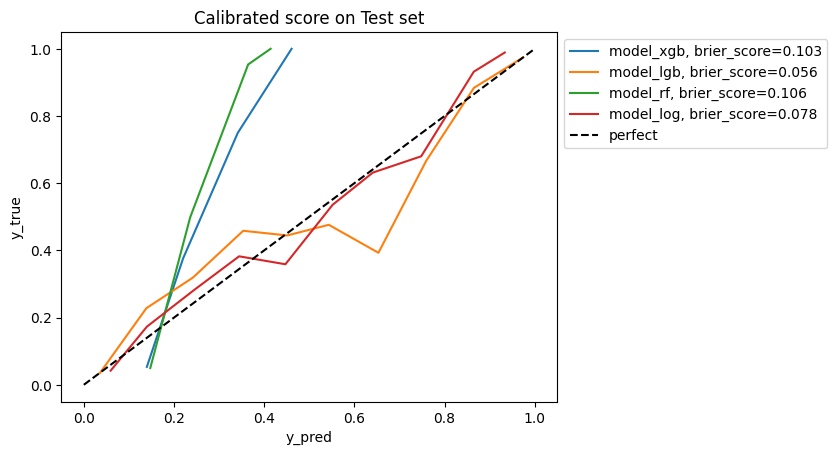

In [278]:
# Строим кривые надежности для классических откалиброванных моделей на тестовом сете

fig = plt.figure()
for i, calibrator in enumerate(calibrators_ml):
    df_test[f'{names_ml[i]}_score_calib'] = calibrator.predict_proba(pd.DataFrame(df_test[f'{names_ml[i]}_score']))[:,1]
    prob_true, prob_pred = calibration_curve(df_test[target_col], df_test[f'{names_ml[i]}_score_calib'], n_bins=10)
    score = brier_score_loss(df_test[target_col], df_test[f'{names_ml[i]}_score_calib'])
    plt.title('Calibrated score on Test set')
    plt.plot(prob_pred, prob_true, label=f'{names_ml[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_calib_test_ml.pdf')

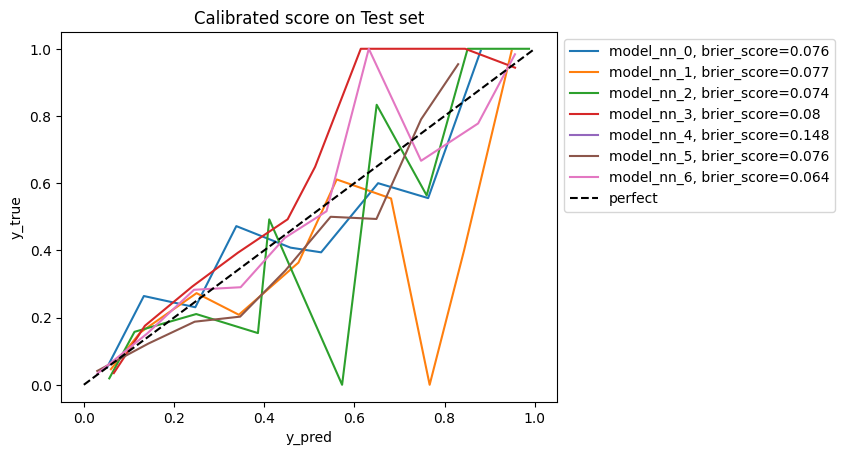

In [279]:
# Строим кривые надежности для откалиброванных нейронок на тестовом сете

fig = plt.figure()
for i, calibrator in enumerate(calibrators_nn):
    df_test[f'{names_nn[i]}_score_calib'] = calibrator.predict_proba(pd.DataFrame(df_test[f'{names_nn[i]}_score']))[:,1]
    prob_true, prob_pred = calibration_curve(df_test[target_col], df_test[f'{names_nn[i]}_score_calib'], n_bins=10)
    score = brier_score_loss(df_test[target_col], df_test[f'{names_nn[i]}_score_calib'])
    plt.title('Calibrated score on Test set')
    plt.plot(prob_pred, prob_true, label=f'{names_nn[i]}, brier_score={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('y_pred')
plt.ylabel('y_true')
fig.savefig('reliability_curve_calib_test_nn.pdf')

In [280]:
# Сохранение калибраторов ML

# with open('calibrator_xgb.pkl','wb') as f:
#     pickle.dump(calibrators_ml[0], f)
# with open('calibrator_lgb.pkl','wb') as f:
#     pickle.dump(calibrators_ml[1], f)
# with open('calibrator_rf.pkl','wb') as f:
#     pickle.dump(calibrators_ml[2], f)
# with open('calibrator_log.pkl','wb') as f:
#     pickle.dump(calibrators_ml[3], f)

In [281]:
# Сохранение калибраторов NN

# for i, calibrator in enumerate(calibrators_nn):
#     with open(f'calibrator_nn_{i}.pkl','wb') as f:
#         pickle.dump(calibrator, f)

In [287]:
# Сохранение датафреймов со скорами всех моделей

# df_train.to_csv('train_data_with_scores')
# df_valid.to_csv('valid_data_with_scores')
# df_test.to_csv('test_data_with_scores')

# Строим ROC AUC

In [293]:
# Подгружаем данные

df_train = pd.read_csv('train_data_with_scores')
df_valid = pd.read_csv('valid_data_with_scores')
df_test = pd.read_csv('test_data_with_scores')

df_train = df_train.drop(columns='Unnamed: 0', axis=1)
df_valid = df_valid.drop(columns='Unnamed: 0', axis=1)
df_test = df_test.drop(columns='Unnamed: 0', axis=1)

__ROC AUC неоткалиброванных моделей ML__

In [301]:
score_names = ['model_xgb_score', 'model_lgb_score', 'model_rf_score', 'model_log_score']
model_names = ['model_xgb', 'model_lgb', 'model_rf', 'model_log']

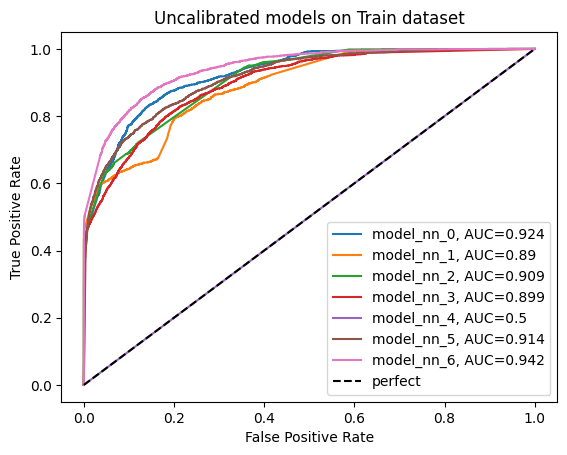

In [386]:
# Train

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_train[target_col], df_train[name], pos_label=1)
    score = roc_auc_score(df_train[target_col], df_train[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Uncalibrated models on Train dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_uncalib_Train_ml.pdf')

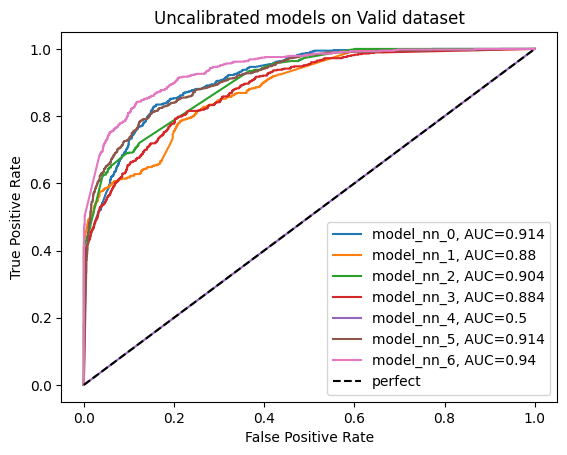

In [385]:
# Valid

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_valid[target_col], df_valid[name], pos_label=1)
    score = roc_auc_score(df_valid[target_col], df_valid[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Uncalibrated models on Valid dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_uncalib_Valid_ml.pdf')

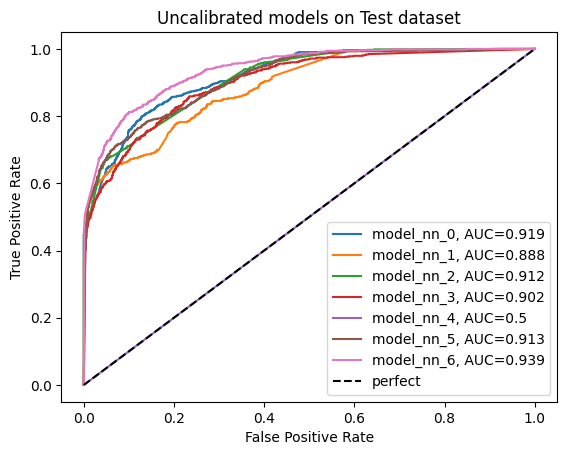

In [384]:
# Test

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_test[target_col], df_test[name], pos_label=1)
    score = roc_auc_score(df_test[target_col], df_test[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Uncalibrated models on Test dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_uncalib_Test_ml.pdf')

__ROC AUC неоткалиброванных нейронных сетей__

In [314]:
score_names = [
    'model_nn_0_score','model_nn_1_score', 'model_nn_2_score', 'model_nn_3_score',
    'model_nn_4_score', 'model_nn_5_score', 'model_nn_6_score',
]
model_names = [
    'model_nn_0','model_nn_1', 'model_nn_2', 'model_nn_3',
    'model_nn_4', 'model_nn_5', 'model_nn_6',
]

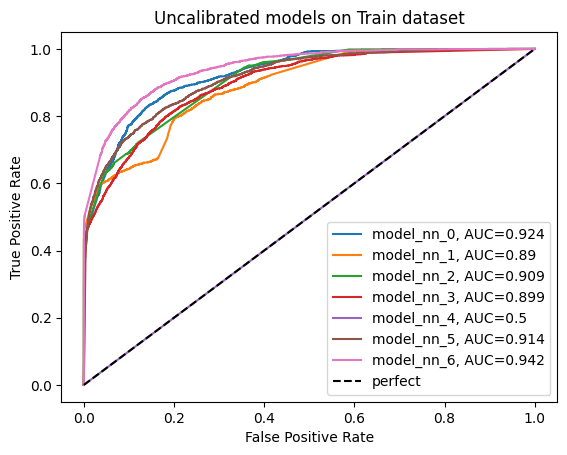

In [383]:
# Train

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_train[target_col], df_train[name], pos_label=1)
    score = roc_auc_score(df_train[target_col], df_train[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Uncalibrated models on Train dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_uncalib_Train_nn.pdf')

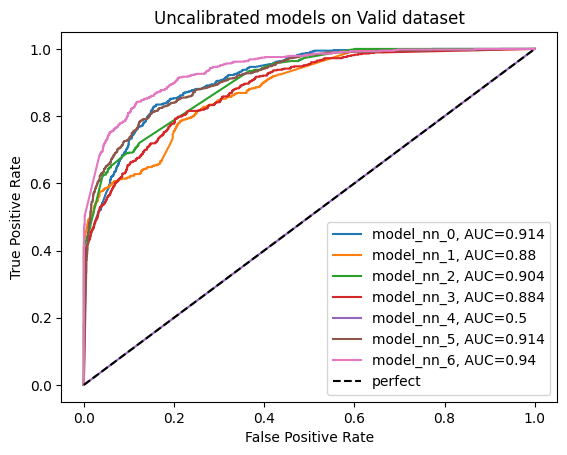

In [382]:
# Valid

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_valid[target_col], df_valid[name], pos_label=1)
    score = roc_auc_score(df_valid[target_col], df_valid[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Uncalibrated models on Valid dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_uncalib_Valid_nn.pdf')

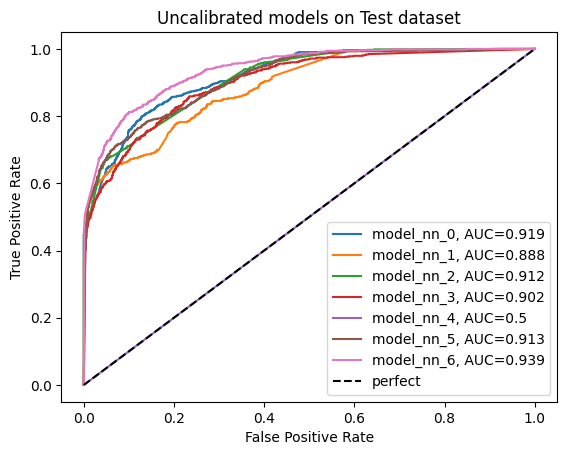

In [381]:
# Test

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_test[target_col], df_test[name], pos_label=1)
    score = roc_auc_score(df_test[target_col], df_test[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Uncalibrated models on Test dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_uncalib_Test_nn.pdf')

__ROC AUC откалиброванных моделей ML__

In [319]:
score_names = ['model_xgb_score_calib', 'model_lgb_score_calib', 'model_rf_score_calib', 'model_log_score_calib']
model_names = ['model_xgb', 'model_lgb', 'model_rf', 'model_log']

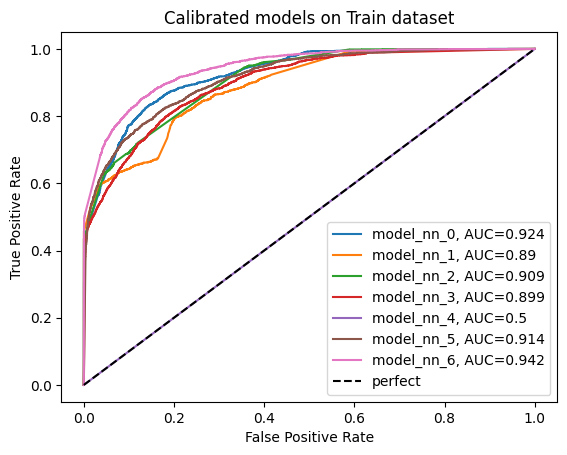

In [380]:
# Train

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_train[target_col], df_train[name], pos_label=1)
    score = roc_auc_score(df_train[target_col], df_train[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Calibrated models on Train dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_calib_Train_ml.pdf')

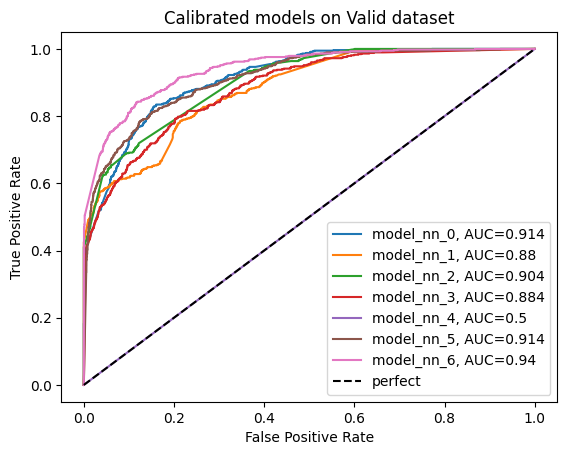

In [379]:
# Valid

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_valid[target_col], df_valid[name], pos_label=1)
    score = roc_auc_score(df_valid[target_col], df_valid[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Calibrated models on Valid dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_calib_Valid_ml.pdf')

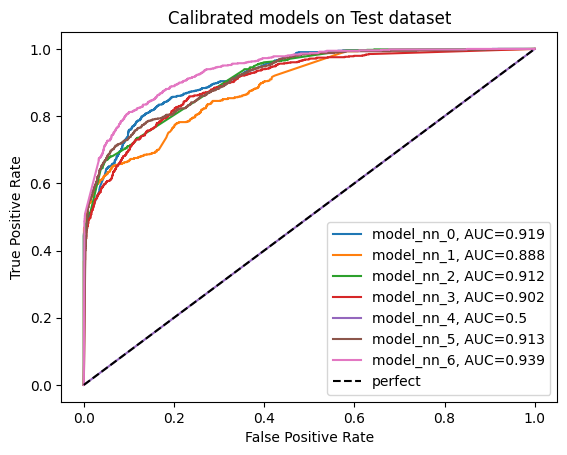

In [378]:
# Test

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_test[target_col], df_test[name], pos_label=1)
    score = roc_auc_score(df_test[target_col], df_test[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Calibrated models on Test dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_calib_Test_ml.pdf')

__ROC AUC откалиброванных нейронных сетей__

In [327]:
score_names = [
    'model_nn_0_score_calib','model_nn_1_score_calib', 'model_nn_2_score_calib', 'model_nn_3_score_calib',
    'model_nn_4_score_calib', 'model_nn_5_score_calib', 'model_nn_6_score_calib',
]
model_names = [
    'model_nn_0','model_nn_1', 'model_nn_2', 'model_nn_3',
    'model_nn_4', 'model_nn_5', 'model_nn_6',
]

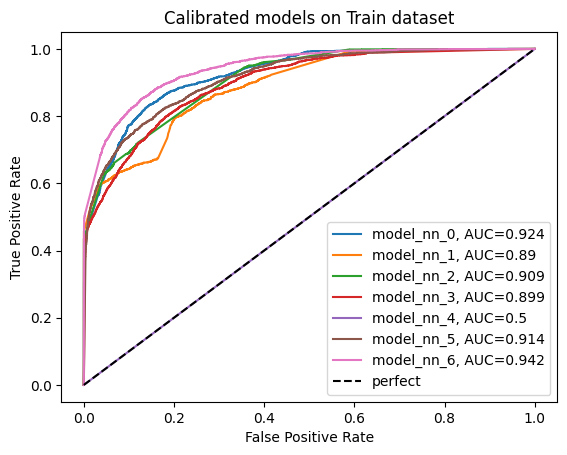

In [377]:
# Train

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_train[target_col], df_train[name], pos_label=1)
    score = roc_auc_score(df_train[target_col], df_train[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Calibrated models on Train dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_calib_Train_nn.pdf')

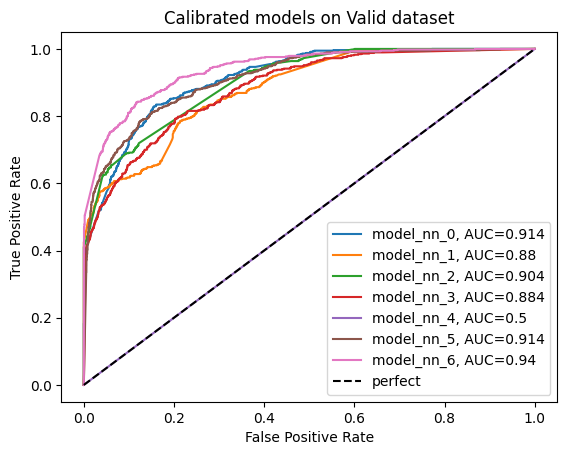

In [375]:
# Valid

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_valid[target_col], df_valid[name], pos_label=1)
    score = roc_auc_score(df_valid[target_col], df_valid[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Calibrated models on Valid dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_calib_Valid_nn.pdf')

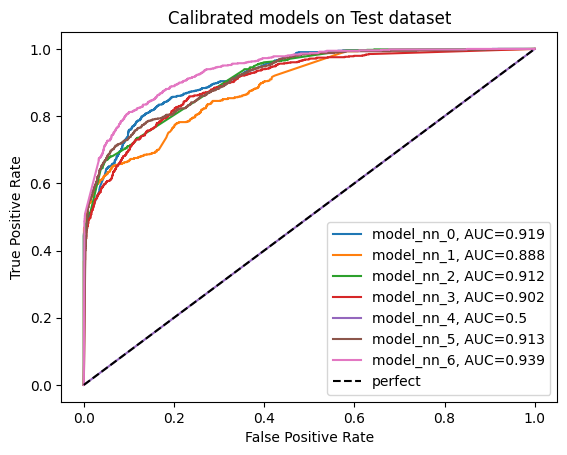

In [376]:
# Test

fig = plt.figure()
for i, name in enumerate(score_names):
    fpr, tpr, thresholds = roc_curve(df_test[target_col], df_test[name], pos_label=1)
    score = roc_auc_score(df_test[target_col], df_test[name])
    plt.plot(fpr, tpr, label=f'{model_names[i]}, AUC={round(score, 3)}')
plt.plot([0, 1], [0, 1], '--', color='black', label='perfect')
plt.title('Calibrated models on Test dataset')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
fig.savefig('roc_auc_calib_Test_nn.pdf')

# Monitoring

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

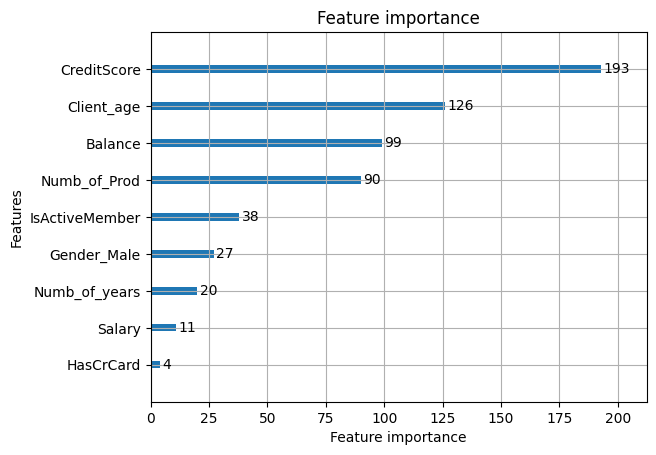

In [354]:
plot_importance(model_lgb)

In [355]:
# Загрузим лучшие модели

with open('model_lgb.pkl', 'rb') as f:
    model_lgb = pickle.load(f)

model_nn = load_model('model_nn_6.h5')

In [371]:
# Будем перемешивать признаки в датасете в порядке повышения их важности

features = ['HasCrCard', 'Salary', 'Numb_of_years', 'Gender_Male', 'IsActiveMember', 'Numb_of_Prod', 'Balance', 'Client_age', 'CreditScore']

auc_lgb = [roc_auc_score(df_test[target_col], df_test['model_lgb_score'])]
auc_nn = [roc_auc_score(df_test[target_col], df_test['model_nn_6_score'])]
for i in range(len(features)):

    feats = features[:i]

    df_for_importance = df_test.copy()
    print(df_for_importance[feats + [target_col]].head())
    df_for_importance[feats] = np.random.permutation(df_for_importance[feats].values)
    print(df_for_importance[feats + [target_col]].head())

    df_for_importance['metric_lgb'] = model_lgb.predict_proba(df_for_importance[feature_columns])[:, 1]
    df_for_importance['metric_nn'] = model_nn.predict(df_for_importance[feature_columns])[:, 1]

    auc_lgb.append(roc_auc_score(df_for_importance[target_col], df_for_importance['metric_lgb']))
    auc_nn.append(roc_auc_score(df_for_importance[target_col], df_for_importance['metric_nn']))

   res
0  0.0
1  1.0
2  0.0
3  0.0
4  0.0
   res
0  0.0
1  1.0
2  0.0
3  0.0
4  0.0
126/126 [==============================] - 1s 3ms/step
   HasCrCard  res
0        1.0  0.0
1        1.0  1.0
2        1.0  0.0
3        1.0  0.0
4        1.0  0.0
   HasCrCard  res
0        1.0  0.0
1        1.0  1.0
2        1.0  0.0
3        1.0  0.0
4        1.0  0.0
126/126 [==============================] - 0s 3ms/step
   HasCrCard    Salary  res
0        1.0 -1.551280  0.0
1        1.0 -0.046301  1.0
2        1.0  0.256776  0.0
3        1.0 -1.115298  0.0
4        1.0  0.256776  0.0
   HasCrCard    Salary  res
0        1.0 -0.046301  0.0
1        1.0  1.417538  1.0
2        1.0  1.417538  0.0
3        1.0  1.417538  0.0
4        1.0 -1.115298  0.0
126/126 [==============================] - 1s 5ms/step
   HasCrCard    Salary  Numb_of_years  res
0        1.0 -1.551280      -0.754591  0.0
1        1.0 -0.046301      -1.582846  1.0
2        1.0  0.256776      -0.340464  0.0
3        1.0 -1.115298     

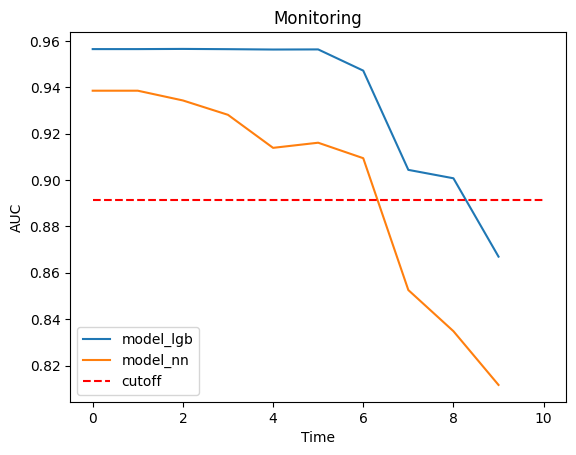

In [394]:
cutoff = min([auc_lgb[0], auc_nn[0]]) - min([auc_lgb[0], auc_nn[0]]) * 0.05 # Модель стоит переобучать при ухудшении метрики на 5%
end = len(auc_nn)

fig = plt.figure()
plt.plot(auc_lgb, label='model_lgb')
plt.plot(auc_nn, label='model_nn')
plt.plot([0, end], [cutoff, cutoff], '--', color='red', label='cutoff')
plt.title('Monitoring')
plt.xlabel('Time')
plt.ylabel('AUC')
plt.legend(loc='lower left')
fig.savefig('Monitoring.pdf')